## LSTM Modelling

In [0]:
#!curl --header "Host: doc-14-0o-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.108 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header "Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header "Referer: https://drive.google.com/drive/u/0/folders/1CJnItndeSSJu7aragQoXWZS9-0apN6pp" --header "Cookie: AUTH_a10vsrvju3nmk58p4f9r0hlfi24jsnpl_nonce=dc24ulop05ivo" --header "Connection: keep-alive" "https://doc-14-0o-docs.googleusercontent.com/docs/securesc/5b7nt381dev31fcnlebkam5uqu5q09jv/gbsfrj25j6q2nrrisnafi2jap43252c7/1574316000000/00484516897554883881/09455067711096929223/1HcuqSNQg60HhHhj8z5neZxkzwE2miwuD?e=download&authuser=0&nonce=dc24ulop05ivo&user=09455067711096929223&hash=bhmr5kugjdto96qdg92a2kv5o1j8in6i" -o "resources.csv" -L

In [0]:
#!curl --header "Host: doc-00-0o-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.108 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header "Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header "Referer: https://drive.google.com/drive/u/0/folders/1CJnItndeSSJu7aragQoXWZS9-0apN6pp" --header "Cookie: AUTH_a10vsrvju3nmk58p4f9r0hlfi24jsnpl=09455067711096929223|1574316000000|53ufji0jmlguq13g1nqku73souu16et3" --header "Connection: keep-alive" "https://doc-00-0o-docs.googleusercontent.com/docs/securesc/5b7nt381dev31fcnlebkam5uqu5q09jv/9docojgkrjgpec3ls7mcir783plu933r/1574316000000/00484516897554883881/09455067711096929223/1QZaaCI5qamo6Qc00LSTfF81e7ZqUcrgH?e=download&authuser=0" -o "train_data.csv" -L

<pre>
1. Preprocess all the Data we have in DonorsChoose <a href='https://drive.google.com/drive/folders/1MIwK7BQMev8f5CbDDVNLPaFGB32pFN60'>Dataset</a> use train.csv
2. Combine 4 essay's into one column named - 'preprocessed_essays'. 
3. After step 2 you have to train 3 types of models as discussed below. 
4. For all the model use <a href='https://scikit-learn.org/stable/modules/model_evaluation.html#roc-metrics'>'auc'</a> as a metric. check <a href='https://datascience.stackexchange.com/a/20192'>this</a> for using auc as a metric 
5. You are free to choose any number of layers/hiddden units but you have to use same type of architectures shown below. 
6. You can use any one of the optimizers and choice of Learning rate and momentum, resources: <a href='http://cs231n.github.io/neural-networks-3/'>cs231n class notes</a>, <a href='https://www.youtube.com/watch?v=hd_KFJ5ktUc'>cs231n class video</a>. 
7. For all the model's use <a href='https://www.youtube.com/watch?v=2U6Jl7oqRkM'>TensorBoard</a> and plot the Metric value and Loss with epoch. While submitting, take a screenshot of plots and include those images in .ipynb notebook and PDF. 
8. Use Categorical Cross Entropy as Loss to minimize.
</pre>

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


### Model-1

Build and Train deep neural network as shown below

<img src='https://i.imgur.com/w395Yk9.png'>
ref: https://i.imgur.com/w395Yk9.png

- __Input_seq_total_text_data__ --- You have to give Total text data columns. After this use the Embedding layer to get word vectors. Use given predefined glove word vectors, don't train any word vectors. After this use LSTM and get the LSTM output and Flatten that output. 
- __Input_school_state__ --- Give 'school_state' column as input to embedding layer and Train the Keras Embedding layer. 
- __Project_grade_category__  --- Give 'project_grade_category' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_clean_categories__ --- Give 'input_clean_categories' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_clean_subcategories__ --- Give 'input_clean_subcategories' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_clean_subcategories__ --- Give 'input_teacher_prefix' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_remaining_teacher_number_of_previously_posted_projects._resource_summary_contains_numerical_digits._price._quantity__ ---concatenate remaining columns and add a Dense layer after that. 



- For LSTM, you can choose your sequence padding methods on your own or you can train your LSTM without padding, there is no restriction on that.

Below is an example of embedding layer for a categorical columns. In below code all are dummy values, we gave only for referance. 

In [0]:
"""
# https://stats.stackexchange.com/questions/270546/how-does-keras-embedding-layer-work
input_layer = Input(shape=(n,))
embedding = Embedding(no_1, no_2, input_length=n)(input_layer)
flatten = Flatten()(embedding)
"""

'\n# https://stats.stackexchange.com/questions/270546/how-does-keras-embedding-layer-work\ninput_layer = Input(shape=(n,))\nembedding = Embedding(no_1, no_2, input_length=n)(input_layer)\nflatten = Flatten()(embedding)\n'

### 1. Go through this blog, if you have any doubt on using predefined Embedding values in Embedding layer - https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
### 2. Please go through this link https://keras.io/getting-started/functional-api-guide/ and check the 'Multi-input and multi-output models' then you will get to know how to give multiple inputs. 

In [14]:
# importing required libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from keras.layers import Input, Embedding, LSTM, Dropout, BatchNormalization, Dense, concatenate, Flatten, Conv1D, MaxPool1D, LeakyReLU, ELU, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer, one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model
from keras import regularizers
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_auc_score
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import re
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import pickle

Using TensorFlow backend.


In [15]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm_notebook as tqdm1
from tqdm import tqdm
import time
import os

import chart_studio.plotly
#from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from sklearn.model_selection import train_test_split


In [0]:
#project_data = pd.read_csv('preprocessed_data.csv')
#project_data.head()

In [0]:

resource_data=pd.read_csv('/content/drive/My Drive/LSTM_colab_file/resources.csv')
project_data=pd.read_csv('/content/drive/My Drive/LSTM_colab_file/train.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (182080, 16)
--------------------------------------------------
The attributes of data : ['id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


### Text_preprocessing:

### project_subject_categories:

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

In [0]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(5)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Literacy,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,"Performing Arts, Team Sports",Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports
2,p233823,a9b876a9252e08a55e3d894150f75ba3,Ms.,UT,2017-01-01 22:57:44,Grades 3-5,"Applied Sciences, Literature & Writing",Lets 3Doodle to Learn,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,We are looking to add some 3Doodler to our cla...,NaN,NaN,My students need the 3doodler. We are an SEM s...,5,1,Math_Science Literacy_Language
3,p185307,525fdbb6ec7f538a48beebaa0a51b24f,Mr.,NC,2016-08-12 15:42:11,Grades 3-5,Health & Wellness,"\""Kid Inspired\"" Equipment to Increase Activit...",My students are the greatest students but are ...,"The student's project which is totally \""kid-i...",NaN,NaN,My students need balls and other activity equi...,16,0,Health_Sports
4,p013780,a63b5547a7239eae4c1872670848e61a,Mr.,CA,2016-08-06 09:09:11,Grades 6-8,Health & Wellness,We need clean water for our culinary arts class!,My students are athletes and students who are ...,For some reason in our kitchen the water comes...,NaN,NaN,My students need a water filtration system for...,42,1,Health_Sports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())
my_counter

Counter({'AppliedLearning': 20303,
         'Care_Hunger': 2327,
         'Health_Sports': 23712,
         'History_Civics': 9726,
         'Literacy_Language': 86988,
         'Math_Science': 69248,
         'Music_Arts': 17054,
         'SpecialNeeds': 22881,
         'Warmth': 2327})

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved category wise')
# plt.xticks(ind, list(sorted_cat_dict.keys()))
# plt.show()
# print(sorted_cat_dict)

### project_subject_subcategories:

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [0]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_sub_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_sub_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved state wise')
# plt.xticks(ind, list(sorted_sub_cat_dict.keys()))
# plt.show()

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [0]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
#presence of the numerical digits in a strings with numeric : https://stackoverflow.com/a/19859308/8089731
def hasNumbers(inputString):
    return any(i.isdigit() for i in inputString)
p1 = project_data[['id','project_resource_summary']]
p1 = pd.DataFrame(data=p1)
p1.columns = ['id','digits_in_summary']
p1['digits_in_summary'] =  p1['digits_in_summary'].map(hasNumbers)
# https://stackoverflow.com/a/17383325/8089731
p1['digits_in_summary'] = p1['digits_in_summary'].astype(int)
project_data = pd.merge(project_data, p1, on='id', how='left')
project_data.head(5)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0
2,p233823,a9b876a9252e08a55e3d894150f75ba3,Ms.,UT,2017-01-01 22:57:44,Grades 3-5,Lets 3Doodle to Learn,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,We are looking to add some 3Doodler to our cla...,NaN,NaN,My students need the 3doodler. We are an SEM s...,5,1,Math_Science Literacy_Language,AppliedSciences Literature_Writing,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,469.99,1,1
3,p185307,525fdbb6ec7f538a48beebaa0a51b24f,Mr.,NC,2016-08-12 15:42:11,Grades 3-5,"\""Kid Inspired\"" Equipment to Increase Activit...",My students are the greatest students but are ...,"The student's project which is totally \""kid-i...",NaN,NaN,My students need balls and other activity equi...,16,0,Health_Sports,Health_Wellness,My students are the greatest students but are ...,684.47,5,0
4,p013780,a63b5547a7239eae4c1872670848e61a,Mr.,CA,2016-08-06 09:09:11,Grades 6-8,We need clean water for our culinary arts class!,My students are athletes and students who are ...,For some reason in our kitchen the water comes...,NaN,NaN,My students need a water filtration system for...,42,1,Health_Sports,Health_Wellness,My students are athletes and students who are ...,355.50,2,0


In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm1(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('nannan', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())


In [0]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for title in tqdm1(project_data['project_title'].values):
    _title = decontracted(title)
    _title = _title.replace('\\r', ' ')
    _title = _title.replace('\\"', ' ')
    _title = _title.replace('\\n', ' ')
    _title = re.sub('[^A-Za-z0-9]+', ' ', _title)
    # https://gist.github.com/sebleier/554280
    _title = ' '.join(e for e in _title.split() if e not in stopwords)
    preprocessed_titles.append(_title.lower().strip())

In [0]:
preprocessed_titles[1022]

'seat storage sacks organization'

In [0]:
project_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python



project_grade_cat_list = []
for i in tqdm1(project_grade_catogories):
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    project_grade_cat_list.append(temp.strip())

In [0]:
project_data['clean_project_grade_category'] = project_grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1,GradesPreK-2
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0,Grades3-5


In [0]:
project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Super Sight Word Centers,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1,GradesPreK-2
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Keep Calm and Dance On,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0,Grades3-5


In [0]:
#Replacing Nan's with maximum occured value: https://stackoverflow.com/a/51053916/8089731
project_data['teacher_prefix'].value_counts().argmax()
project_data.fillna(value=project_data['teacher_prefix'].value_counts().argmax(),axis=1,inplace=True)

In [0]:
project_data['preprocessed_essays'] = preprocessed_essays
project_data['preprocessed_titles'] = preprocessed_titles

In [0]:
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
# X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [0]:
X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
# X_cv.drop(['project_is_approved'], axis=1, inplace=True)
print(X_train.shape)
print(X_test.shape)

(121993, 17)
(60087, 17)


In [0]:
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding 

# Reference:

### Word Embeddings in Keras for essays(text).
https://medium.com/@ppasumarthi_69210/word-embeddings-in-keras-be6bb3092831

In [0]:
# A word embedding is a class of approaches for representing words and documents using a dense vector representation.
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train["essay"].tolist())
seq_train = tokenizer.texts_to_sequences(X_train["essay"])
seq_test = tokenizer.texts_to_sequences(X_test["essay"])

In [0]:
vocab_size = len(tokenizer.word_index) + 1

In [0]:
padded_train = pad_sequences(seq_train,maxlen=800,padding='post', truncating='post')
padded_test = pad_sequences(seq_test, maxlen=800,padding='post', truncating='post')

In [0]:
#!curl --header "Host: doc-00-0o-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.108 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header "Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header "Referer: https://drive.google.com/drive/folders/1XA26jfjklV1MTd4dY6dQF4U72A9rCDIm" --header "Cookie: AUTH_a10vsrvju3nmk58p4f9r0hlfi24jsnpl=09455067711096929223|1574316000000|53ufji0jmlguq13g1nqku73souu16et3" --header "Connection: keep-alive" "https://doc-00-0o-docs.googleusercontent.com/docs/securesc/5b7nt381dev31fcnlebkam5uqu5q09jv/d97leuedcbivfbldmt3vpk1gb82nguf3/1574316000000/00484516897554883881/09455067711096929223/1pGd5tLwA30M7wkbJKdXHaae9tYVDICJ_?e=download&authuser=0" -o "glove_vectors" -L

In [0]:
with open('/content/drive/My Drive/LSTM_colab_file/glove_vectors', 'rb') as f:
    glove_words=pickle.load(f)
    #glove_words =  set(model.keys())

In [0]:
embedding_matrix = zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
    embedding_vector = glove_words.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [0]:
# input_text = Input(shape=(800,),name="input_text")
embedding_layer = Embedding(vocab_size,300,weights=[embedding_matrix],input_length=800,trainable=False)
input_text = Input(shape=(800,),name="input_text")
x = embedding_layer(input_text)
x = LSTM(128,recurrent_dropout=0.5,kernel_regularizer=regularizers.l2(0.001),return_sequences=True)(x)
flat_1 = Flatten()(x)











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
#import dill 
#dill.dump_session('notebook_envall.db') 
#dill.load_session('notebook_envall.db')

In [0]:
#Return the ceiling of the input, element-wise.
#The ceil of the scalar x is the smallest integer i, such that i >= x. It is often denoted as \lceil x \rceil.
#Teacher Prefix

no_of_unique_prefix  = X_train["teacher_prefix"].nunique()
no_of_unique_prefix 

5

In [0]:
#Teacher Prefix
#The rule of thumb for determining the embedding size is the cardinality size divided by 2, but no bigger than 50.
embed_size_prefix = int(min(np.ceil((no_of_unique_prefix)/2), 50 ))
embed_size_prefix

3

In [0]:
#Teacher Prefix
input_prefix = Input(shape=(1,),name="teacher_prefix")
embed_prefix = Embedding(no_of_unique_prefix,embed_size_prefix,trainable=True)(input_prefix)
flat_2 = Flatten()(embed_prefix)
lab_enc = LabelEncoder()
enc_prefix_train = lab_enc.fit_transform(X_train["teacher_prefix"])
X_test["teacher_prefix"] = X_test["teacher_prefix"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_prefix_test = lab_enc.transform(X_test["teacher_prefix"])

In [0]:
# School State
no_of_unique_state  = X_train["school_state"].nunique()
embed_size_state= int(min(np.ceil((no_of_unique_state)/2), 50 ))

input_state = Input(shape=(1,),name="school_prefix")
embed_state = Embedding(no_of_unique_state,embed_size_state,name="emb_state",trainable=True)(input_state)
flat_3 = Flatten()(embed_state)
enc_state_train = lab_enc.fit_transform(X_train["school_state"])
enc_state_test = lab_enc.transform(X_test["school_state"])


In [0]:
enc_state_train 

array([10, 18, 25, ..., 20, 34, 47])

In [0]:
enc_state_test 

array([ 4, 14, 22, ..., 40, 23, 37])

In [0]:
#project_grade_category
no_of_unique_grade  = X_train["clean_project_grade_category"].nunique()
embed_size_grade = int(min(np.ceil((no_of_unique_grade)/2), 50 ))

input_grade= Input(shape=(1,),name="grade_cat")
embed_grade = Embedding(no_of_unique_grade,embed_size_grade,name="emb_grade",trainable=True)(input_grade)
flat_4 = Flatten()(embed_grade)
enc_grade_train = lab_enc.fit_transform(X_train["clean_project_grade_category"])
enc_grade_test = lab_enc.transform(X_test["clean_project_grade_category"])

In [0]:
#project_subject_categories
no_of_unique_subcat  = X_train["clean_categories"].nunique()
embed_size_subcat = int(min(np.ceil((no_of_unique_subcat)/2), 50 ))

input_subcat= Input(shape=(1,),name="sub_cat")
embed_subcat = Embedding(no_of_unique_subcat,embed_size_subcat,name="emb_subcat",trainable=True)(input_subcat)
flat_5 = Flatten()(embed_subcat)
lab_enc = LabelEncoder()
enc_subcat_train = lab_enc.fit_transform(X_train["clean_categories"])
X_test["clean_categories"] = X_test["clean_categories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_test= lab_enc.transform(X_test["clean_categories"])

In [0]:
#project_subject_subcategories
no_of_unique_subcat_1  = X_train["clean_subcategories"].nunique()
embed_size_subcat_1 = int(min(np.ceil((no_of_unique_subcat_1)/2), 50 ))

input_subcat_1= Input(shape=(1,),name="sub_cat_1")
embedding_subcat_1 = Embedding(no_of_unique_subcat_1,embed_size_subcat_1,name="emb_subcat_1",trainable=True)(input_subcat_1)
flat_6 = Flatten()(embedding_subcat_1)
lab_enc = LabelEncoder()
enc_subcat_1_train = lab_enc.fit_transform(X_train["clean_subcategories"])
X_test["clean_subcategories"] = X_test["clean_subcategories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_1_test= lab_enc.transform(X_test["clean_subcategories"])

In [0]:
numerical_train_a=X_train['digits_in_summary'].values.reshape(-1, 1)
numerical_test_a=X_test['digits_in_summary'].values.reshape(-1, 1)

numerical_train_b=X_train['price'].values.reshape(-1, 1)
numerical_test_b=X_test['price'].values.reshape(-1, 1)

numerical_train_c=X_train['quantity'].values.reshape(-1, 1)
numerical_test_c=X_test['quantity'].values.reshape(-1, 1)

numerical_train_d=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_test_d=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)


numerical_train=np.concatenate((numerical_train_a,numerical_train_b,numerical_train_c,numerical_train_d),axis=1)
numerical_test=np.concatenate((numerical_test_a,numerical_test_b,numerical_test_c,numerical_test_d),axis=1)

from sklearn.preprocessing import StandardScaler
normal=StandardScaler()
normal_train=normal.fit_transform(numerical_train)
normal_test=normal.transform(numerical_test)

In [0]:
numerical_feats = Input(shape=(4,),name="numerical_features")
numerical_featss = Dense(100,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(numerical_feats)

In [0]:
x = concatenate([flat_1,flat_2,flat_3,flat_4,flat_5,flat_6,numerical_featss])
x = Dense(128,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(256,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(64,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x = BatchNormalization()(x)
output = Dense(2, activation='softmax', name='output')(x)
model_1 = Model(inputs=[input_text,input_prefix,input_state,input_grade,input_subcat,input_subcat_1,numerical_feats],outputs=[output])

In [0]:
train_data_1 = [padded_train,enc_prefix_train,enc_state_train,enc_grade_train,enc_subcat_train,enc_subcat_1_train,normal_train]
test_data_1 = [padded_test,enc_prefix_test,enc_state_test,enc_grade_test,enc_subcat_test,enc_subcat_1_test,normal_test]

In [0]:
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)

In [0]:
import tensorflow as tf
from sklearn.metrics import roc_auc_score

def auroc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

In [0]:
model_1.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=[auroc])



Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    


In [0]:
!pip3 install -U tensorboardcolab

Requirement already up-to-date: tensorboardcolab in /usr/local/lib/python3.6/dist-packages (0.0.22)


In [0]:
#https://github.com/taomanwai/tensorboardcolab/
from tensorboardcolab import *

In [0]:
tbc=TensorBoardColab()

Wait for 8 seconds...
TensorBoard link:
http://0b4dc55a.ngrok.io


In [0]:
checkpoint_3 = ModelCheckpoint("model_1.h5",monitor="val_auroc",mode="max",save_best_only = True,verbose=1)
NAME = 'model_1'
tensorboard_2 = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=512)
callbacks_2 = [tensorboard_2,checkpoint_3,TensorBoardColabCallback(tbc)]

In [0]:
history_1 = model_1.fit(train_data_1,Y_train,batch_size=512,
                        epochs=15,validation_data=(test_data_1,Y_test),verbose=1,callbacks=(callbacks_2))

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 121993 samples, validate on 60087 samples


Epoch 1/15
121993/121993 [==============================] - 328s 3ms/step - loss: 1.2068 - auroc: 0.5186 - val_loss: 0.7732 - val_auroc: 0.5829


Epoch 00001: val_auroc improved from -inf to 0.58286, saving model to model_1.h5
Epoch 2/15
121993/121993 [==============================] - 323s 3ms/step - loss: 0.6589 - auroc: 0.6214 - val_loss: 0.5828 - val_auroc: 0.7324

Epoch 00002: val_auroc improved from 0.58286 to 0.73240, saving model to model_1.h5
Epoch 3/15
121993/121993 [==============================] - 321s 3ms/step - loss: 0.5208 - auroc: 0.7290 - val_loss: 0.4855 - val_auroc: 0.7597

Epoch 00003: val_auroc improved from 0.73240 to 0.75967, saving model to model_1.h5
Epoch 4/15
121993/121993 [==============================] - 321s 3ms/step - loss: 0.4606 - auroc: 0.7477 - val_loss: 0.4510 - val_auroc: 0.7616

Epoch 00004: val_auro

In [0]:
#tbc.save_image(title="model_1", image=events)

In [0]:
#import dill 
#dill.dump_session('notebook_envall.db') 
#dill.load_session('notebook_enval1.db')

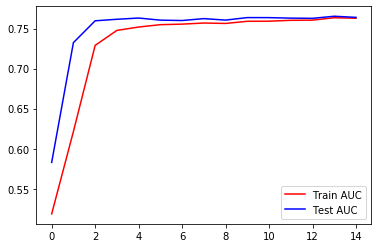

In [0]:
plt.plot(history_1.history['auroc'], 'r')
plt.plot(history_1.history['val_auroc'], 'b')
plt.legend({'Train AUC': 'r', 'Test AUC':'b'})
plt.show()

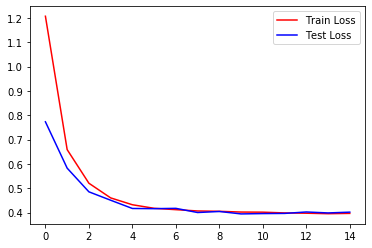

In [0]:
plt.plot(history_1.history['loss'], 'r')
plt.plot(history_1.history['val_loss'], 'b')
plt.legend({'Train Loss': 'r', 'Test Loss':'b'})
plt.show()

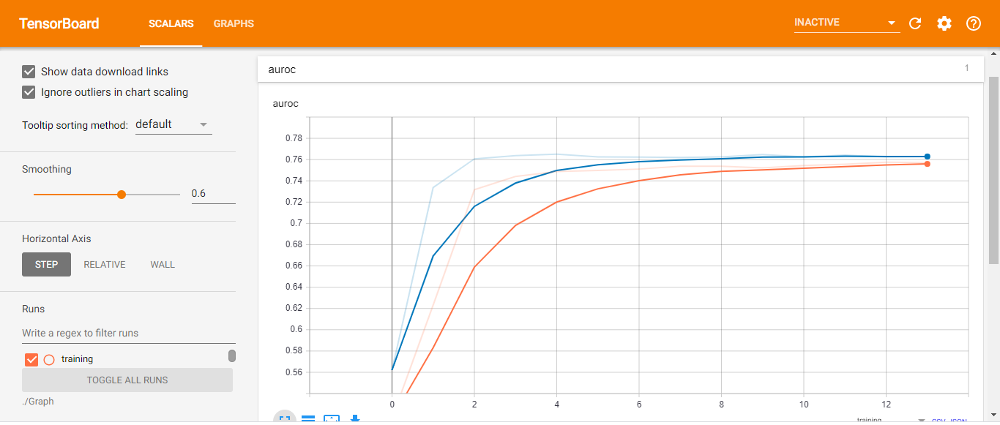

In [1]:

from IPython.display import Image
Image("model_1_accuracy.png")

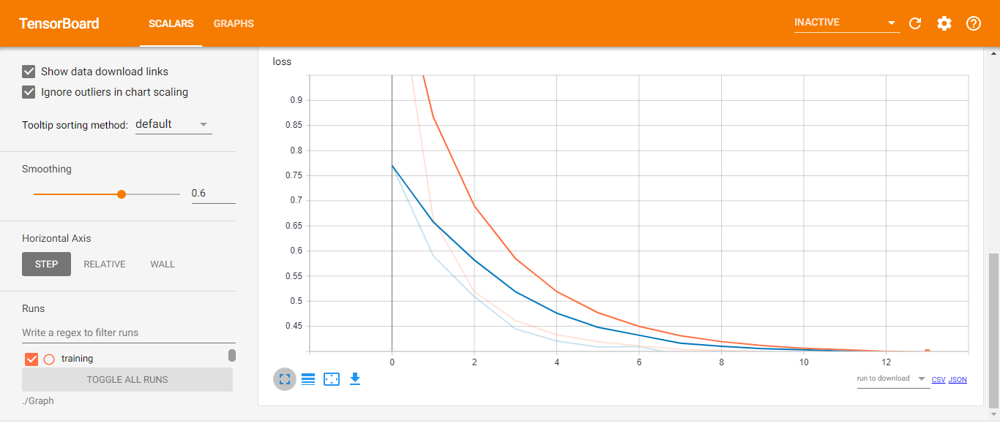

In [2]:
from IPython.display import Image
Image("model_1_loss.png")

In [0]:
#import dill 
#dill.dump_session('notebook_envall.db') 
#dill.load_session('notebook_enval1.db')

#https://medium.com/better-programming/dont-fear-the-pickle-using-pickle-dump-and-pickle-load-5212f23dbbce
import pickle 
with open('LSTM_colab_file', 'wb') as f:
    pickle.dump('Copy of Copy of LSTM_master - Assignment', f)


In [0]:
#with open('LSTM_colab_file', 'rb') as f:
    #dest_object_name = pickle.load(f)

### Model-2

Use the same model as above but for 'input_seq_total_text_data' give only some words in the sentance not all the words. Filter the words as below. 

<pre>
1. Train the TF-IDF on the Train data <br>
2. Get the idf value for each word we have in the train data. <br>
3. Remove the low idf value and high idf value words from our data. Do some analysis on the Idf values and based on those values choose the low and high threshold value. Because very frequent words and very very rare words don't give much information. (you can plot a box plots and take only the idf scores within IQR range and corresponding words)<br>
4. Train the LSTM after removing the Low and High idf value words. (In model-1 Train on total data but in Model-2 train on data after removing some words based on IDF values)
</pre>

In [0]:
# importing required libraries
import warnings
warnings.filterwarnings("ignore")

from keras.layers import Input, Embedding, LSTM, Dropout, BatchNormalization, Dense, concatenate, Flatten, Conv1D, MaxPool1D, LeakyReLU, ELU, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer, one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model
from keras import regularizers
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau

import tensorflow as tf

from tqdm import tqdm
import pickle

import sqlite3

import pandas as pd
import numpy as np

import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
import string

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
chart_studio.plotly
import plotly.offline as offline
import plotly.graph_objs as go

from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder

import re # Tutorial about Python regular expressions: https://pymotw.com/2/re/


from gensim.models import Word2Vec
from gensim.models import KeyedVectors

from tqdm import tqdm_notebook as tqdm1
from tqdm import tqdm
import time
import os

offline.init_notebook_mode()
from collections import Counter



In [0]:
# project_data = pd.read_csv('train_data.csv', nrows=50000)
project_data = pd.read_csv('/content/drive/My Drive/LSTM_colab_file/train.csv')
resource_data = pd.read_csv('/content/drive/My Drive/LSTM_colab_file/resources.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (182080, 16)
--------------------------------------------------
The attributes of data : ['id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [0]:

## Text preprocessing

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(5)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Literacy,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,"Performing Arts, Team Sports",Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports
2,p233823,a9b876a9252e08a55e3d894150f75ba3,Ms.,UT,2017-01-01 22:57:44,Grades 3-5,"Applied Sciences, Literature & Writing",Lets 3Doodle to Learn,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,We are looking to add some 3Doodler to our cla...,NaN,NaN,My students need the 3doodler. We are an SEM s...,5,1,Math_Science Literacy_Language
3,p185307,525fdbb6ec7f538a48beebaa0a51b24f,Mr.,NC,2016-08-12 15:42:11,Grades 3-5,Health & Wellness,"\""Kid Inspired\"" Equipment to Increase Activit...",My students are the greatest students but are ...,"The student's project which is totally \""kid-i...",NaN,NaN,My students need balls and other activity equi...,16,0,Health_Sports
4,p013780,a63b5547a7239eae4c1872670848e61a,Mr.,CA,2016-08-06 09:09:11,Grades 6-8,Health & Wellness,We need clean water for our culinary arts class!,My students are athletes and students who are ...,For some reason in our kitchen the water comes...,NaN,NaN,My students need a water filtration system for...,42,1,Health_Sports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())
my_counter

Counter({'AppliedLearning': 20303,
         'Care_Hunger': 2327,
         'Health_Sports': 23712,
         'History_Civics': 9726,
         'Literacy_Language': 86988,
         'Math_Science': 69248,
         'Music_Arts': 17054,
         'SpecialNeeds': 22881,
         'Warmth': 2327})

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())

In [0]:

# dict sort by value python: https://stackoverflow.com/a/613218/4084039
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)


In [0]:

# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [0]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')


In [0]:
#presence of the numerical digits in a strings with numeric : https://stackoverflow.com/a/19859308/8089731
def hasNumbers(inputString):
    return any(i.isdigit() for i in inputString)
p1 = project_data[['id','project_resource_summary']]
p1 = pd.DataFrame(data=p1)
p1.columns = ['id','digits_in_summary']
p1['digits_in_summary'] =  p1['digits_in_summary'].map(hasNumbers)
# https://stackoverflow.com/a/17383325/8089731
p1['digits_in_summary'] = p1['digits_in_summary'].astype(int)
project_data = pd.merge(project_data, p1, on='id', how='left')
project_data.head(5)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0
2,p233823,a9b876a9252e08a55e3d894150f75ba3,Ms.,UT,2017-01-01 22:57:44,Grades 3-5,Lets 3Doodle to Learn,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,We are looking to add some 3Doodler to our cla...,NaN,NaN,My students need the 3doodler. We are an SEM s...,5,1,Math_Science Literacy_Language,AppliedSciences Literature_Writing,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,469.99,1,1
3,p185307,525fdbb6ec7f538a48beebaa0a51b24f,Mr.,NC,2016-08-12 15:42:11,Grades 3-5,"\""Kid Inspired\"" Equipment to Increase Activit...",My students are the greatest students but are ...,"The student's project which is totally \""kid-i...",NaN,NaN,My students need balls and other activity equi...,16,0,Health_Sports,Health_Wellness,My students are the greatest students but are ...,684.47,5,0
4,p013780,a63b5547a7239eae4c1872670848e61a,Mr.,CA,2016-08-06 09:09:11,Grades 6-8,We need clean water for our culinary arts class!,My students are athletes and students who are ...,For some reason in our kitchen the water comes...,NaN,NaN,My students need a water filtration system for...,42,1,Health_Sports,Health_Wellness,My students are athletes and students who are ...,355.50,2,0


## Text preprocessing

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase


In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm1(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('nannan', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

In [0]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for title in tqdm1(project_data['project_title'].values):
    _title = decontracted(title)
    _title = _title.replace('\\r', ' ')
    _title = _title.replace('\\"', ' ')
    _title = _title.replace('\\n', ' ')
    _title = re.sub('[^A-Za-z0-9]+', ' ', _title)
    # https://gist.github.com/sebleier/554280
    _title = ' '.join(e for e in _title.split() if e not in stopwords)
    preprocessed_titles.append(_title.lower().strip())

In [0]:
preprocessed_titles[700]

'saving paper ditching desk change lives'

In [0]:
project_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

project_grade_cat_list = []
for i in tqdm1(project_grade_catogories):
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    project_grade_cat_list.append(temp.strip())

project_data['clean_project_grade_category'] = project_grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1,GradesPreK-2
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0,Grades3-5


In [0]:
project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)
project_data.head(2)


,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Super Sight Word Centers,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1,GradesPreK-2
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Keep Calm and Dance On,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0,Grades3-5


In [0]:
#Replacing Nan's with maximum occured value: https://stackoverflow.com/a/51053916/8089731
project_data['teacher_prefix'].value_counts().argmax()
project_data.fillna(value=project_data['teacher_prefix'].value_counts().argmax(),axis=1,inplace=True)


In [0]:
project_data['preprocessed_essays'] = preprocessed_essays
project_data['preprocessed_titles'] = preprocessed_titles

In [0]:
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
# X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [0]:
X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
# X_cv.drop(['project_is_approved'], axis=1, inplace=True)
print(X_train.shape)
print(X_test.shape)


(121993, 17)
(60087, 17)


In [0]:
X_train

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
139554,p240847,5c78a5f61195a52e73935c71b56b0f58,Mrs.,IA,2016-08-08 08:56:12,Bouncing Off Nets in PE to Improve Fitness and...,My students need a Tchoukball Start Kit and Sp...,0,Health_Sports,Gym_Fitness,My students are hard workers that love movemen...,633.25,3,0,Grades9-12,my students hard workers love movements they c...,bouncing off nets pe improve fitness skills
143789,p041495,5a54ef592f4a938fe0ec247a60962c11,Mrs.,NY,2017-01-18 10:09:24,Transforming Learning with Robotics in Element...,My students need 7 Dot & Dash robots with acce...,1,Math_Science,AppliedSciences,The majority of my students come from low-inco...,719.93,5,1,Grades3-5,the majority students come low income poverty ...,transforming learning robotics elementary educ...
122412,p232803,efbec30dd939ea8cf424f51322402d06,Mr.,WA,2016-09-18 20:28:56,Belt Sander For STEM Students With Grit,"My students need a 30\"" x 1\"" belt sander alon...",5,Math_Science,AppliedSciences,"Creative, driven, and innovative, this group o...",127.97,3,1,Grades9-12,creative driven innovative group high school r...,belt sander for stem students with grit
163219,p097270,3429d29ecba4a37ac5bd69ded4aab341,Mrs.,AZ,2017-01-24 22:05:19,Free Fall - Is It True?,"My students need a gravity drop apparatus, a f...",45,Math_Science,AppliedSciences EnvironmentalScience,I teach physics & chemistry to eighth graders ...,633.04,16,0,Grades6-8,i teach physics chemistry eighth graders subur...,free fall is it true
48937,p134814,721bdf7c5c4a8b34b127ec887a139afa,Teacher,KY,2016-08-06 13:01:01,"Technology, Helping One Student at a Time!!!",My students need 3 chrome books for their onli...,0,AppliedLearning Math_Science,College_CareerPrep Mathematics,"Hello, my students live in a small town in eas...",172.34,3,1,Grades6-8,hello students live small town eastern kentuck...,technology helping one student time
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10817,p046115,00c7c7d11a51271348439a346d158649,Mr.,NY,2016-10-12 07:13:21,Heat Vision: IR Cameras for Student Discovery,My students need their own thermal imaging cam...,1,Math_Science,AppliedSciences Health_LifeScience,New York City has three big specialized high s...,435.41,6,0,Grades9-12,new york city three big specialized high schoo...,heat vision ir cameras student discovery
4554,p192218,8efef6358ea9978e7e2b576e748ab748,Mrs.,OH,2017-04-19 13:21:07,Reading and Writing with Chromebooks,My students need access to Chromebooks for add...,0,Literacy_Language,ESL Literacy,As a teacher in a low income school we are fac...,255.07,4,0,Grades3-5,as teacher low income school faced many challe...,reading writing chromebooks
115841,p239686,edc845664be8e78da69036937b93a360,Ms.,CA,2017-03-30 18:20:27,Oraciones Divertidas in Spanish!,My students need 9 Oraciones divertidas! board...,4,Literacy_Language,ForeignLanguages,I teach Spanish to high school students. They...,29.24,9,1,Grades9-12,i teach spanish high school students they eage...,oraciones divertidas spanish
26581,p018382,7be5f936035f0e292921f77160aad173,Mr.,VA,2016-05-13 19:34:52,"Itsy Bitsy Pieces, Oh Where Oh Where Did You G...",My students need replacement lego parts.,27,Math_Science,AppliedSciences Mathematics,This year was our first school year with Lego ...,98.99,2,0,Grades3-5,this year first school year lego wedo robotics...,itsy bitsy pieces oh where oh where did you go


In [0]:
#import dill 
#dill.dump_session('notebook_envall.db') 
#dill.load_session('notebook_envall.db')


In [0]:

from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding 

In [0]:
tfidf = TfidfVectorizer()
_tfidf = tfidf.fit_transform(X_train["essay"])
_dict = dict(zip(tfidf.get_feature_names(),list(tfidf.idf_)))
tfidf_df = pd.DataFrame(list(_dict.items()), columns=['Words', 'Values'])
tfidf_df = tfidf_df.sort_values(by ='Values' )

Text(0.5, 1.0, 'BOX plot of idf')

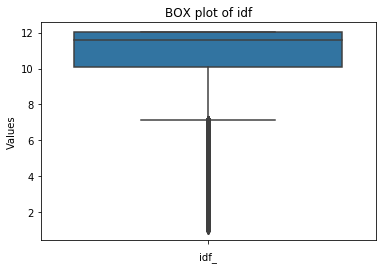

In [0]:
sns.boxplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("BOX plot of idf")

In [0]:
print("0 - 100 Quantiles:")
print(np.percentile(tfidf_df['Values'],np.arange(0, 100, 25)))

0 - 100 Quantiles:
[ 1.00013116 10.07266981 11.61311485 12.01857996]


In [0]:
print("1th Percentile")
print(np.percentile(tfidf_df['Values'],1))
print("\n27th Percentiles")
print(np.percentile(tfidf_df['Values'],27))

1th Percentile
4.246754004446053

27th Percentiles
10.226820492390132


In [0]:
tfidf_fil = tfidf_df[(tfidf_df["Values"] >=  np.percentile(tfidf_df['Values'],1)) & (tfidf_df["Values"] <=  np.percentile(tfidf_df['Values'],25))]

Text(0.5, 1.0, 'VIOLIN plot of idf')

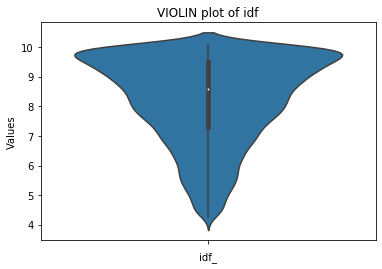

In [0]:
sns.violinplot(x = "Values",data=tfidf_fil,orient="v")
plt.xlabel("idf_")
plt.title("VIOLIN plot of idf")

In [0]:
fil_words = tfidf_fil["Words"].tolist()

In [0]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(fil_words)
seq_train = tokenizer.texts_to_sequences(X_train["essay"])
seq_test = tokenizer.texts_to_sequences(X_test["essay"])

In [0]:
vocab_size = len(tokenizer.word_index) + 1

In [0]:
padded_train = pad_sequences(seq_train,maxlen=800,padding='post', truncating='post')
padded_test = pad_sequences(seq_test, maxlen=800,padding='post', truncating='post')

In [0]:
with open('/content/drive/My Drive/LSTM_colab_file/glove_vectors', 'rb') as f:
    glove_words=pickle.load(f)
    #glove_words =  set(model.keys())

In [0]:
embedding_matrix = zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
    embedding_vector = glove_words.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [0]:
# input_text = Input(shape=(800,),name="input_text")
embedding_layer = Embedding(vocab_size,300,weights=[embedding_matrix],input_length=800,trainable=False)
input_text = Input(shape=(800,),name="input_text")
x = embedding_layer(input_text)
x = LSTM(128,recurrent_dropout=0.5,kernel_regularizer=regularizers.l2(0.001),return_sequences=True)(x)
flat_1 = Flatten()(x)

In [0]:
# Teacher Prefix
no_of_unique_prefix  = X_train["teacher_prefix"].nunique()
embed_size_prefix = int(min(np.ceil((no_of_unique_prefix)/2), 50 ))


input_prefix = Input(shape=(1,),name="teacher_prefix")
embed_prefix = Embedding(no_of_unique_prefix,embed_size_prefix,trainable=True)(input_prefix)
flat_2 = Flatten()(embed_prefix)
lab_enc = LabelEncoder()
enc_prefix_train = lab_enc.fit_transform(X_train["teacher_prefix"])
X_test["teacher_prefix"] = X_test["teacher_prefix"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_prefix_test = lab_enc.transform(X_test["teacher_prefix"])

In [0]:
# School State
no_of_unique_state  = X_train["school_state"].nunique()
embed_size_state= int(min(np.ceil((no_of_unique_state)/2), 50 ))

input_state = Input(shape=(1,),name="school_prefix")
embed_state = Embedding(no_of_unique_state,embed_size_state,name="emb_state",trainable=True)(input_state)
flat_3 = Flatten()(embed_state)
enc_state_train = lab_enc.fit_transform(X_train["school_state"])
enc_state_test = lab_enc.transform(X_test["school_state"])

In [0]:
#X_train

In [0]:
#project_grade_category
no_of_unique_grade  = X_train["clean_project_grade_category"].nunique()
embed_size_grade = int(min(np.ceil((no_of_unique_grade)/2), 50 ))
input_grade= Input(shape=(1,),name="grade_cat")
embed_grade = Embedding(no_of_unique_grade,embed_size_grade,name="emb_grade",trainable=True)(input_grade)
flat_4 = Flatten()(embed_grade)
enc_grade_train = lab_enc.fit_transform(X_train["clean_project_grade_category"])
enc_grade_test = lab_enc.transform(X_test["clean_project_grade_category"])

In [0]:
#project_subject_categories
no_of_unique_subcat  = X_train["clean_categories"].nunique()
embed_size_subcat = int(min(np.ceil((no_of_unique_subcat)/2), 50 ))

input_subcat= Input(shape=(1,),name="sub_cat")
embed_subcat = Embedding(no_of_unique_subcat,embed_size_subcat,name="emb_subcat",trainable=True)(input_subcat)
flat_5 = Flatten()(embed_subcat)
lab_enc = LabelEncoder()
enc_subcat_train = lab_enc.fit_transform(X_train["clean_categories"])
X_test["clean_categories"] = X_test["clean_categories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_test= lab_enc.transform(X_test["clean_categories"])


In [0]:
#project_subject_subcategories
no_of_unique_subcat_1  = X_train["clean_subcategories"].nunique()
embed_size_subcat_1 = int(min(np.ceil((no_of_unique_subcat_1)/2), 50 ))

input_subcat_1= Input(shape=(1,),name="sub_cat_1")
embedding_subcat_1 = Embedding(no_of_unique_subcat_1,embed_size_subcat_1,name="emb_subcat_1",trainable=True)(input_subcat_1)
flat_6 = Flatten()(embedding_subcat_1)
lab_enc = LabelEncoder()
enc_subcat_1_train = lab_enc.fit_transform(X_train["clean_subcategories"])
X_test["clean_subcategories"] = X_test["clean_subcategories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_1_test= lab_enc.transform(X_test["clean_subcategories"])

In [0]:
numerical_train_a=X_train['digits_in_summary'].values.reshape(-1, 1)
numerical_train_b=X_train['price'].values.reshape(-1, 1)
numerical_train_c=X_train['quantity'].values.reshape(-1, 1)
numerical_train_d=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_test_a=X_test['digits_in_summary'].values.reshape(-1, 1)
numerical_test_b=X_test['price'].values.reshape(-1, 1)
numerical_test_c=X_test['quantity'].values.reshape(-1, 1)
numerical_test_d=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_train=np.concatenate((numerical_train_a,numerical_train_b,numerical_train_c,numerical_train_d),axis=1)
numerical_test=np.concatenate((numerical_test_a,numerical_test_b,numerical_test_c,numerical_test_d),axis=1)

from sklearn.preprocessing import StandardScaler
normal=StandardScaler()
normal_train=normal.fit_transform(numerical_train)
normal_test=normal.transform(numerical_test)

In [0]:
numerical_feats = Input(shape=(4,),name="numerical_features")
numerical_featss = Dense(100,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(numerical_feats)

In [0]:
x = concatenate([flat_1,flat_2,flat_3,flat_4,flat_5,flat_6,numerical_featss])
x = Dense(128,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(256,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(64,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x = BatchNormalization()(x)
output = Dense(2, activation='softmax', name='output')(x)
model_2 = Model(inputs=[input_text,input_prefix,input_state,input_grade,input_subcat,input_subcat_1,numerical_feats],outputs=[output])

In [0]:
train_data_1 = [padded_train,enc_prefix_train,enc_state_train,enc_grade_train,enc_subcat_train,enc_subcat_1_train,normal_train]
test_data_1 = [padded_test,enc_prefix_test,enc_state_test,enc_grade_test,enc_subcat_test,enc_subcat_1_test,normal_test]

In [0]:
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)


In [0]:
import tensorflow as tf
from sklearn.metrics import roc_auc_score


def auroc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)


In [0]:
model_2.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=[auroc])

In [0]:
from tensorboardcolab import *

In [0]:
tbc=TensorBoardColab()

Wait for 8 seconds...
TensorBoard link:
http://0b4dc55a.ngrok.io


In [0]:
checkpoint_3 = ModelCheckpoint("model_2.h5",monitor="val_auroc",mode="max",save_best_only = True,verbose=1)
NAME = 'model_2'
tensorboard_2 = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=512)
callbacks_2 = [tensorboard_2,checkpoint_3,TensorBoardColabCallback(tbc)]


In [0]:
history_1 = model_2.fit(train_data_1,Y_train,batch_size=512,
                        epochs=15,validation_data=(test_data_1,Y_test),verbose=1,callbacks=callbacks_2)


Train on 121993 samples, validate on 60087 samples
Epoch 1/15
121993/121993 [==============================] - 329s 3ms/step - loss: 1.1327 - auroc: 0.6175 - val_loss: 0.7365 - val_auroc: 0.7028

Epoch 00001: val_auroc improved from -inf to 0.70278, saving model to model_2.h5
Epoch 2/15
121993/121993 [==============================] - 330s 3ms/step - loss: 0.6317 - auroc: 0.6926 - val_loss: 0.5525 - val_auroc: 0.7155

Epoch 00002: val_auroc improved from 0.70278 to 0.71552, saving model to model_2.h5
Epoch 3/15
121993/121993 [==============================] - 330s 3ms/step - loss: 0.5153 - auroc: 0.7057 - val_loss: 0.4912 - val_auroc: 0.7221

Epoch 00003: val_auroc improved from 0.71552 to 0.72214, saving model to model_2.h5
Epoch 4/15
121993/121993 [==============================] - 327s 3ms/step - loss: 0.4682 - auroc: 0.7071 - val_loss: 0.4461 - val_auroc: 0.7240

Epoch 00004: val_auroc improved from 0.72214 to 0.72402, saving model to model_2.h5
Epoch 5/15
121993/121993 [==========

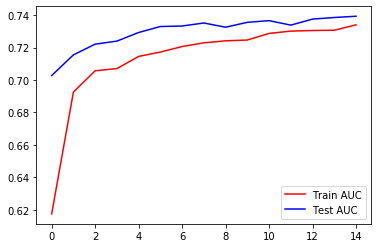

In [0]:
plt.plot(history_1.history['auroc'], 'r')
plt.plot(history_1.history['val_auroc'], 'b')
plt.legend({'Train AUC': 'r', 'Test AUC':'b'})
plt.show()

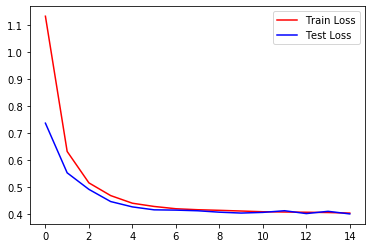

In [0]:

plt.plot(history_1.history['loss'], 'r')
plt.plot(history_1.history['val_loss'], 'b')
plt.legend({'Train Loss': 'r', 'Test Loss':'b'})
plt.show()

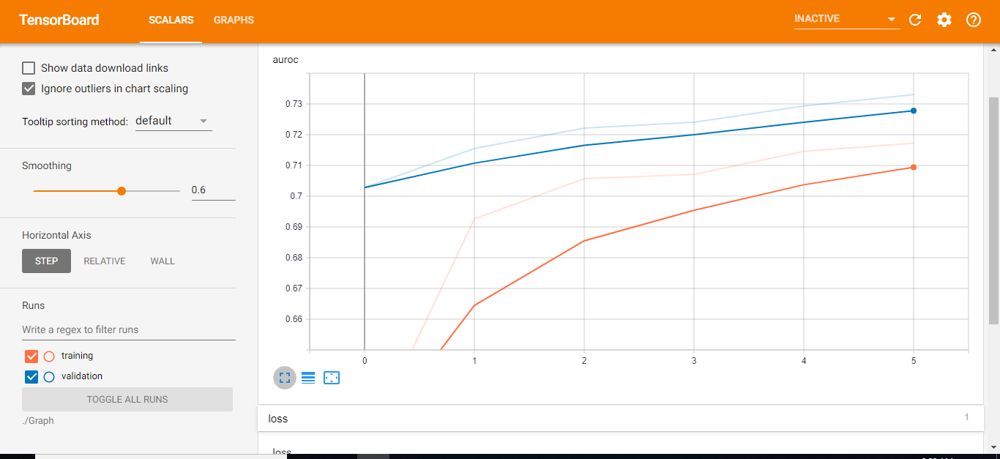

In [5]:
from IPython.display import Image
Image("model_2_accuracy.png")

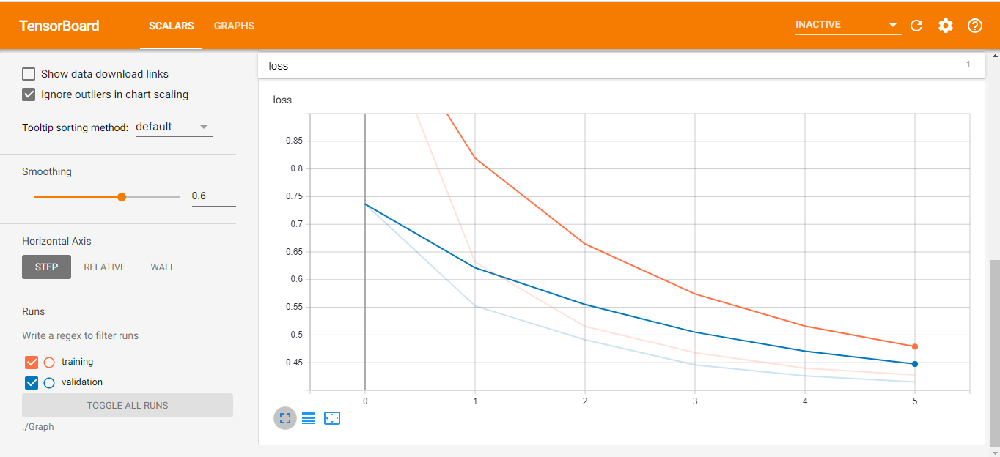

In [6]:
from IPython.display import Image
Image("model_2_loss.png")

### Model-3

<img src='https://i.imgur.com/fkQ8nGo.png'>
ref: https://i.imgur.com/fkQ8nGo.png


- __input_seq_total_text_data__: <br>
<pre>
    . Use text column('essay'), and use the Embedding layer to get word vectors. <br>
    . Use given predefined glove word vectors, don't train any word vectors. <br>
    . Use LSTM that is given above, get the LSTM output and Flatten that output. <br>
    . You are free to preprocess the input text as you needed. <br>
</pre>
- __Other_than_text_data__:<br>
<pre>
    . Convert all your Categorical values to onehot coded and then concatenate all these onehot vectors <br>
    . Neumerical values and use <a href='https://keras.io/getting-started/sequential-model-guide/#sequence-classification-with-1d-convolutions'>CNN1D</a> as shown in above figure. <br>
    . You are free to choose all CNN parameters like kernel sizes, stride.<br>
    
</pre>

In [0]:
# importing required libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from keras.layers import Input, Embedding, LSTM, Dropout, BatchNormalization, Dense, concatenate, Flatten, Conv1D, MaxPool1D, LeakyReLU, ELU, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer, one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model
from keras import regularizers
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_auc_score
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import re
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import pickle

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm_notebook as tqdm1
from tqdm import tqdm
import time
import os

chart_studio.plotly 
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from sklearn.model_selection import train_test_split


In [0]:
# project_data = pd.read_csv('train_data.csv', nrows=50000)
project_data = pd.read_csv('/content/drive/My Drive/LSTM_colab_file/train.csv')
resource_data = pd.read_csv('/content/drive/My Drive/LSTM_colab_file/resources.csv')


In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)


Number of data points in train data (182080, 16)
--------------------------------------------------
The attributes of data : ['id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']



## Text preprocessing

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039


In [0]:
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(5)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Literacy,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,"Performing Arts, Team Sports",Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports
2,p233823,a9b876a9252e08a55e3d894150f75ba3,Ms.,UT,2017-01-01 22:57:44,Grades 3-5,"Applied Sciences, Literature & Writing",Lets 3Doodle to Learn,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,We are looking to add some 3Doodler to our cla...,NaN,NaN,My students need the 3doodler. We are an SEM s...,5,1,Math_Science Literacy_Language
3,p185307,525fdbb6ec7f538a48beebaa0a51b24f,Mr.,NC,2016-08-12 15:42:11,Grades 3-5,Health & Wellness,"\""Kid Inspired\"" Equipment to Increase Activit...",My students are the greatest students but are ...,"The student's project which is totally \""kid-i...",NaN,NaN,My students need balls and other activity equi...,16,0,Health_Sports
4,p013780,a63b5547a7239eae4c1872670848e61a,Mr.,CA,2016-08-06 09:09:11,Grades 6-8,Health & Wellness,We need clean water for our culinary arts class!,My students are athletes and students who are ...,For some reason in our kitchen the water comes...,NaN,NaN,My students need a water filtration system for...,42,1,Health_Sports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())
my_counter

Counter({'AppliedLearning': 20303,
         'Care_Hunger': 2327,
         'Health_Sports': 23712,
         'History_Civics': 9726,
         'Literacy_Language': 86988,
         'Math_Science': 69248,
         'Music_Arts': 17054,
         'SpecialNeeds': 22881,
         'Warmth': 2327})

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))



In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())


In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)


In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))


In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)


,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [0]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
#presence of the numerical digits in a strings with numeric : https://stackoverflow.com/a/19859308/8089731
def hasNumbers(inputString):
    return any(i.isdigit() for i in inputString)
p1 = project_data[['id','project_resource_summary']]
p1 = pd.DataFrame(data=p1)
p1.columns = ['id','digits_in_summary']
p1['digits_in_summary'] =  p1['digits_in_summary'].map(hasNumbers)
# https://stackoverflow.com/a/17383325/8089731
p1['digits_in_summary'] = p1['digits_in_summary'].astype(int)
project_data = pd.merge(project_data, p1, on='id', how='left')
project_data.head(5)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Grades PreK-2,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Grades 3-5,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0
2,p233823,a9b876a9252e08a55e3d894150f75ba3,Ms.,UT,2017-01-01 22:57:44,Grades 3-5,Lets 3Doodle to Learn,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,We are looking to add some 3Doodler to our cla...,NaN,NaN,My students need the 3doodler. We are an SEM s...,5,1,Math_Science Literacy_Language,AppliedSciences Literature_Writing,Hello;\r\nMy name is Mrs. Brotherton. I teach ...,469.99,1,1
3,p185307,525fdbb6ec7f538a48beebaa0a51b24f,Mr.,NC,2016-08-12 15:42:11,Grades 3-5,"\""Kid Inspired\"" Equipment to Increase Activit...",My students are the greatest students but are ...,"The student's project which is totally \""kid-i...",NaN,NaN,My students need balls and other activity equi...,16,0,Health_Sports,Health_Wellness,My students are the greatest students but are ...,684.47,5,0
4,p013780,a63b5547a7239eae4c1872670848e61a,Mr.,CA,2016-08-06 09:09:11,Grades 6-8,We need clean water for our culinary arts class!,My students are athletes and students who are ...,For some reason in our kitchen the water comes...,NaN,NaN,My students need a water filtration system for...,42,1,Health_Sports,Health_Wellness,My students are athletes and students who are ...,355.50,2,0


## Text preprocessing

In [0]:


# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]


In [0]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm1(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('nannan', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())


In [0]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for title in tqdm1(project_data['project_title'].values):
    _title = decontracted(title)
    _title = _title.replace('\\r', ' ')
    _title = _title.replace('\\"', ' ')
    _title = _title.replace('\\n', ' ')
    _title = re.sub('[^A-Za-z0-9]+', ' ', _title)
    # https://gist.github.com/sebleier/554280
    _title = ' '.join(e for e in _title.split() if e not in stopwords)
    preprocessed_titles.append(_title.lower().strip())


In [0]:
preprocessed_titles[1000]

'reading rainbow'

In [0]:
project_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039


In [0]:
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

project_grade_cat_list = []
for i in tqdm1(project_grade_catogories):
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    project_grade_cat_list.append(temp.strip())

project_data['clean_project_grade_category'] = project_grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Super Sight Word Centers,Most of my kindergarten students come from low...,I currently have a differentiated sight word c...,NaN,NaN,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1,GradesPreK-2
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Keep Calm and Dance On,Our elementary school is a culturally rich sch...,We strive to provide our diverse population of...,NaN,NaN,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0,Grades3-5


In [0]:

project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)
project_data.head(2)

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,p036502,484aaf11257089a66cfedc9461c6bd0a,Ms.,NV,2016-11-18 14:45:59,Super Sight Word Centers,My students need 6 Ipod Nano's to create and d...,26,1,Literacy_Language,Literacy,Most of my kindergarten students come from low...,299.98,6,1,GradesPreK-2
1,p039565,df72a3ba8089423fa8a94be88060f6ed,Mrs.,GA,2017-04-26 15:57:28,Keep Calm and Dance On,My students need matching shirts to wear for d...,1,0,Music_Arts Health_Sports,PerformingArts TeamSports,Our elementary school is a culturally rich sch...,20.00,20,0,Grades3-5


In [0]:
#Replacing Nan's with maximum occured value: https://stackoverflow.com/a/51053916/8089731
project_data['teacher_prefix'].value_counts().argmax()
project_data.fillna(value=project_data['teacher_prefix'].value_counts().argmax(),axis=1,inplace=True)


In [0]:
project_data['preprocessed_essays'] = preprocessed_essays
project_data['preprocessed_titles'] = preprocessed_titles

In [0]:
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
# X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)


In [0]:
X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
# X_cv.drop(['project_is_approved'], axis=1, inplace=True)
print(X_train.shape)
print(X_test.shape)

(121993, 17)
(60087, 17)


In [0]:
X_train

,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
95535,p008441,179f88be07f08ca83c1d9a77d46343c5,Mrs.,CA,2016-09-01 00:07:25,Dazzling Dinosaur Days!,My students need a number of books and engagin...,5,Math_Science Literacy_Language,EnvironmentalScience Literacy,My students are curious and eager to learn but...,995.27,76,0,GradesPreK-2,my students curious eager learn limited academ...,dazzling dinosaur days
107173,p070880,883c191886d0f5343f14e38bf937cdb2,Ms.,CA,2016-11-24 04:17:55,Technology for 3rd grade bilingual students,My students need iPads to fully incorporate th...,0,Literacy_Language Math_Science,Literature_Writing Mathematics,As a bilingual teacher serving in a title one ...,296.44,4,1,Grades3-5,as bilingual teacher serving title one school ...,technology 3rd grade bilingual students
156394,p124154,d6e84332f3dbe36b988b617c5488372b,Mrs.,CA,2017-02-05 11:01:30,Flexible Seating: Wobble Chairs,My students need additional wobble chairs to a...,4,Literacy_Language Math_Science,Literacy Mathematics,"I have 24 sweet students, majority of whom are...",46.57,8,0,GradesPreK-2,i 24 sweet students majority english language ...,flexible seating wobble chairs
112848,p143717,668bae0eccb3e8ea433cff4599169ee0,Mrs.,TX,2016-08-02 18:36:16,L-etting I-maginative B-rains R-ead A-nd R-ela...,"My students need , high interest books, lighti...",1,Literacy_Language,Literacy,Choosing to work in a low-income/high poverty ...,295.35,27,0,Grades3-5,choosing work low income high poverty school i...,l etting i maginative b rains r ead a nd r ela...
41577,p061536,c8935bd00ffed952a87dc42a4687ed9e,Mrs.,WA,2017-02-14 16:56:41,Sculpting Our Dreams,My students need sculpting and pottery supplie...,1,Music_Arts,VisualArts,The students who attend our after school progr...,150.64,21,0,Grades3-5,the students attend school programs come low i...,sculpting our dreams
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97168,p014602,2486183f074a225a21816fa0981b0b73,Mrs.,CT,2016-07-23 12:02:47,"With a DryErase Table We Can...Write, Do Math ...",My students need a dry erase table to work int...,1,Literacy_Language Math_Science,Literature_Writing Mathematics,As a teacher in a high poverty school district...,211.48,4,0,GradesPreK-2,as teacher high poverty school district studen...,with dryerase table we can write do math share
60186,p217753,a9f3d97c1d9844f249d6eaac8cb2b4df,Ms.,MD,2016-05-06 20:01:46,"Author!Author! You too, Illustrator!",My students need more supplies in our writing ...,0,AppliedLearning,EarlyDevelopment,"Our school motto is \""work hard, get smart.\"" ...",208.81,21,0,GradesPreK-2,our school motto work hard get smart in class ...,author author you illustrator
155662,p254328,4e0e8173472e0087d020dcb7fc028e87,Mrs.,CA,2016-12-07 22:41:06,Some Good News,My students need 23 subscriptions to Time for ...,14,History_Civics,Civics_Government SocialSciences,As my students walk into the classroom they ca...,5.01,23,1,GradesPreK-2,as students walk classroom often heard asking ...,some good news
175594,p058242,906b09cbaf75430a2141b79facfe4853,Mrs.,NJ,2016-08-02 19:46:28,\r\nOn the Go Laboratory,My students need Surface Pro 4 tablets for onl...,0,Math_Science,AppliedSciences Health_LifeScience,My students attend a public school in one of t...,1098.16,2,1,Grades6-8,my students attend public school one poorest v...,on go laboratory


In [0]:

#import dill 
#dill.dump_session('notebook_envall.db') 
#dill.load_session('notebook_envall.db')

In [0]:
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding 


In [0]:
tfidf = TfidfVectorizer()
_tfidf = tfidf.fit_transform(X_train["essay"])
_dict = dict(zip(tfidf.get_feature_names(),list(tfidf.idf_)))
tfidf_df = pd.DataFrame(list(_dict.items()), columns=['Words', 'Values'])
tfidf_df = tfidf_df.sort_values(by ='Values' )

Text(0.5, 1.0, 'BOX plot of idf')

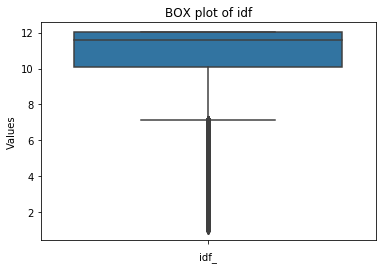

In [0]:
sns.boxplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("BOX plot of idf")

In [0]:
print("0 - 100 Quantiles:")
print(np.percentile(tfidf_df['Values'],np.arange(0, 100, 25)))


0 - 100 Quantiles:
[ 1.00011477 10.07266981 11.61311485 12.01857996]


In [0]:

print("1th Percentile")
print(np.percentile(tfidf_df['Values'],1))

1th Percentile
4.242974745883194


In [0]:

print("\n27th Percentiles")
print(np.percentile(tfidf_df['Values'],27))


27th Percentiles
10.226820492390132


In [0]:
tfidf_fil = tfidf_df[(tfidf_df["Values"] >=  np.percentile(tfidf_df['Values'],1)) & (tfidf_df["Values"] <=  np.percentile(tfidf_df['Values'],25))]


In [0]:
fil_words = tfidf_fil["Words"].tolist()

In [0]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(fil_words)
seq_train = tokenizer.texts_to_sequences(X_train["essay"])
seq_test = tokenizer.texts_to_sequences(X_test["essay"])


In [0]:
vocab_size = len(tokenizer.word_index) + 1


In [0]:
padded_train = pad_sequences(seq_train,maxlen=800,padding='post', truncating='post')
padded_test = pad_sequences(seq_test, maxlen=800,padding='post', truncating='post')

In [0]:
with open('/content/drive/My Drive/LSTM_colab_file/glove_vectors', 'rb') as f:
    glove_words=pickle.load(f)
    #glove_words =  set(model.keys())

In [0]:
embedding_matrix = zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
    embedding_vector = glove_words.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [0]:
# Teacher Prefix
no_of_unique_prefix  = X_train["teacher_prefix"].nunique()
embed_size_prefix = int(min(np.ceil((no_of_unique_prefix)/2), 50 ))

input_prefix = Input(shape=(1,),name="teacher_prefix")
embed_prefix = Embedding(no_of_unique_prefix,embed_size_prefix,trainable=True)(input_prefix)
flat_2 = Flatten()(embed_prefix)
lab_enc = LabelEncoder()
enc_prefix_train = lab_enc.fit_transform(X_train["teacher_prefix"])
X_test["teacher_prefix"] = X_test["teacher_prefix"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_prefix_test = lab_enc.transform(X_test["teacher_prefix"])


In [0]:
# input_text = Input(shape=(800,),name="input_text")
embedding_layer = Embedding(vocab_size,300,weights=[embedding_matrix],input_length=800,trainable=False)
input_text = Input(shape=(800,),name="input_text")
x = embedding_layer(input_text)
x = LSTM(128,recurrent_dropout=0.5,kernel_regularizer=regularizers.l2(0.001),return_sequences=True)(x)
flat_1 = Flatten()(x)

In [0]:
# School State
no_of_unique_state  = X_train["school_state"].nunique()
embed_size_state= int(min(np.ceil((no_of_unique_state)/2), 50 ))

input_state = Input(shape=(1,),name="school_prefix")
embed_state = Embedding(no_of_unique_state,embed_size_state,name="emb_state",trainable=True)(input_state)
flat_3 = Flatten()(embed_state)
enc_state_train = lab_enc.fit_transform(X_train["school_state"])
enc_state_test = lab_enc.transform(X_test["school_state"])

In [0]:
#project_grade_category
no_of_unique_grade  = X_train["clean_project_grade_category"].nunique()
embed_size_grade = int(min(np.ceil((no_of_unique_grade)/2), 50 ))

input_grade= Input(shape=(1,),name="grade_cat")
embed_grade = Embedding(no_of_unique_grade,embed_size_grade,name="emb_grade",trainable=True)(input_grade)
flat_4 = Flatten()(embed_grade)
lab_enc = LabelEncoder()
enc_grade_train = lab_enc.fit_transform(X_train["clean_project_grade_category"])
enc_grade_test = lab_enc.transform(X_test["clean_project_grade_category"])

In [0]:
#project_subject_categories
no_of_unique_subcat  = X_train["clean_categories"].nunique()
embed_size_subcat = int(min(np.ceil((no_of_unique_subcat)/2), 50 ))

input_subcat= Input(shape=(1,),name="sub_cat")
embed_subcat = Embedding(no_of_unique_subcat,embed_size_subcat,name="emb_subcat",trainable=True)(input_subcat)
flat_5 = Flatten()(embed_subcat)
lab_enc = LabelEncoder()
enc_subcat_train = lab_enc.fit_transform(X_train["clean_categories"])
X_test["clean_categories"] = X_test["clean_categories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_test= lab_enc.transform(X_test["clean_categories"])

In [0]:
#project_subject_subcategories
no_of_unique_subcat_1  = X_train["clean_subcategories"].nunique()
embed_size_subcat_1 = int(min(np.ceil((no_of_unique_subcat_1)/2), 50 ))

input_subcat_1= Input(shape=(1,),name="sub_cat_1")
embedding_subcat_1 = Embedding(no_of_unique_subcat_1,embed_size_subcat_1,name="emb_subcat_1",trainable=True)(input_subcat_1)
flat_6 = Flatten()(embedding_subcat_1)
lab_enc = LabelEncoder()
enc_subcat_1_train = lab_enc.fit_transform(X_train["clean_subcategories"])
X_test["clean_subcategories"] = X_test["clean_subcategories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_1_test= lab_enc.transform(X_test["clean_subcategories"])


In [0]:
numerical_train_a=X_train['digits_in_summary'].values.reshape(-1, 1)
numerical_train_b=X_train['price'].values.reshape(-1, 1)
numerical_train_c=X_train['quantity'].values.reshape(-1, 1)
numerical_train_d=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_test_a=X_test['digits_in_summary'].values.reshape(-1, 1)
numerical_test_b=X_test['price'].values.reshape(-1, 1)
numerical_test_c=X_test['quantity'].values.reshape(-1, 1)
numerical_test_d=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_train=np.concatenate((numerical_train_a,numerical_train_b,numerical_train_c,numerical_train_d),axis=1)
numerical_test=np.concatenate((numerical_test_a,numerical_test_b,numerical_test_c,numerical_test_d),axis=1)

from sklearn.preprocessing import StandardScaler
normal=StandardScaler()
normal_train=normal.fit_transform(numerical_train)
normal_test=normal.transform(numerical_test)

In [0]:
numerical_feats = Input(shape=(4,),name="numerical_features")
numerical_featss = Dense(100,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(numerical_feats)


In [0]:
x = concatenate([flat_1,flat_2,flat_3,flat_4,flat_5,flat_6,numerical_featss])
x = Dense(128,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(256,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(64,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x = BatchNormalization()(x)
output = Dense(2, activation='softmax', name='output')(x)
model_3 = Model(inputs=[input_text,input_prefix,input_state,input_grade,input_subcat,input_subcat_1,numerical_feats],outputs=[output])


In [0]:
train_data_1 = [padded_train,enc_prefix_train,enc_state_train,enc_grade_train,enc_subcat_train,enc_subcat_1_train,normal_train]
test_data_1 = [padded_test,enc_prefix_test,enc_state_test,enc_grade_test,enc_subcat_test,enc_subcat_1_test,normal_test]


In [0]:
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)


In [0]:
import tensorflow as tf
from sklearn.metrics import roc_auc_score

def auroc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

In [0]:
model_3.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=[auroc])


In [0]:
from tensorboardcolab import *

In [0]:
tbc=TensorBoardColab()

Wait for 8 seconds...
TensorBoard link:
http://0b4dc55a.ngrok.io


In [0]:
checkpoint_3 = ModelCheckpoint("model_3.h5",monitor="val_auroc",mode="max",save_best_only = True,verbose=1)
NAME = 'model_3'
tensorboard_2 = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=512)
callbacks_2 = [tensorboard_2,checkpoint_3,TensorBoardColabCallback(tbc)]

In [187]:
# from tensorflow.keras.callbacks import TensorBoard
# import time

# # NAME = 'cc-{}'.format(int(time.time()))
# # tensorboardd = TensorBoard(log_dir='C:\Users\LENOVO\Desktop\applidai\AAIC\logss\\')
# NAME = 'model_2'
# tensorboardd = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=320)
# # tensorboard_1 = TensorBoard(log_dir='logss\{}'.format(NAME), histogram_freq=0, batch_size=320, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None, embeddings_data=None, update_freq='epoch')

history_1 = model_3.fit(train_data_1,Y_train,batch_size=512,epochs=15,validation_data=(test_data_1,Y_test),verbose=1,callbacks=callbacks_2)


Train on 121993 samples, validate on 60087 samples
Epoch 1/15
121993/121993 [==============================] - 328s 3ms/step - loss: 1.1345 - auroc: 0.6146 - val_loss: 0.7358 - val_auroc: 0.7074

Epoch 00001: val_auroc improved from -inf to 0.70740, saving model to model_3.h5
Epoch 2/15
121993/121993 [==============================] - 326s 3ms/step - loss: 0.6337 - auroc: 0.6961 - val_loss: 0.5561 - val_auroc: 0.7216

Epoch 00002: val_auroc improved from 0.70740 to 0.72160, saving model to model_3.h5
Epoch 3/15
121993/121993 [==============================] - 331s 3ms/step - loss: 0.5178 - auroc: 0.7071 - val_loss: 0.4819 - val_auroc: 0.7246

Epoch 00003: val_auroc improved from 0.72160 to 0.72461, saving model to model_3.h5
Epoch 4/15
121993/121993 [==============================] - 330s 3ms/step - loss: 0.4660 - auroc: 0.7139 - val_loss: 0.4452 - val_auroc: 0.7284

Epoch 00004: val_auroc improved from 0.72461 to 0.72843, saving model to model_3.h5
Epoch 5/15
121993/121993 [==========

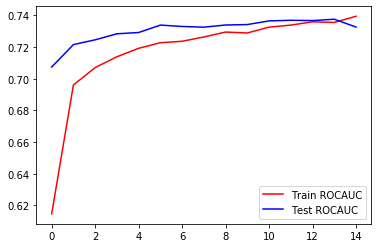

In [188]:
plt.plot(history_1.history['auroc'], 'r')
plt.plot(history_1.history['val_auroc'], 'b')
plt.legend({'Train ROCAUC': 'r', 'Test ROCAUC':'b'})
plt.show()

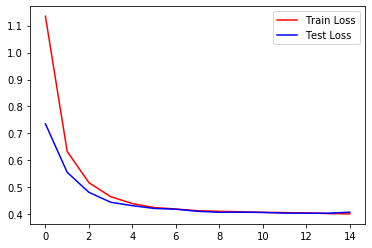

In [189]:
plt.plot(history_1.history['loss'], 'r')
plt.plot(history_1.history['val_loss'], 'b')
plt.legend({'Train Loss': 'r', 'Test Loss':'b'})
plt.show()

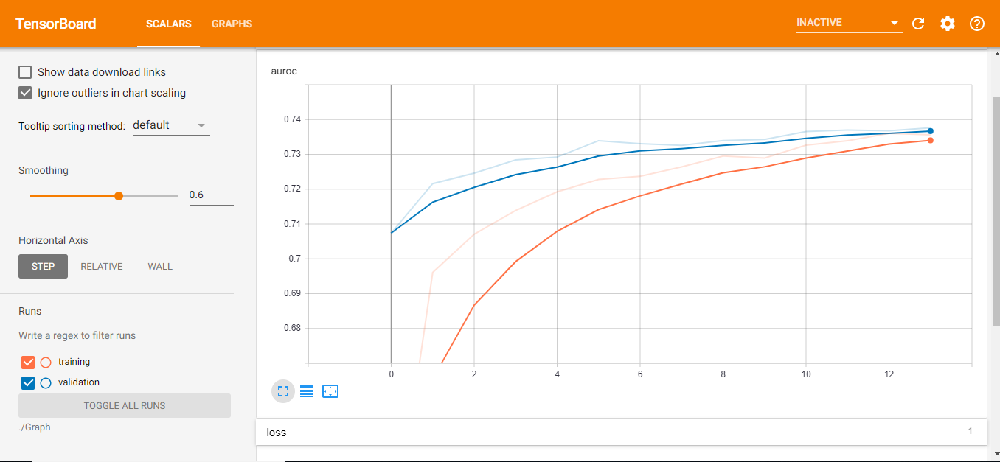

In [9]:

from IPython.display import Image
Image("model_3_accuracy.png")

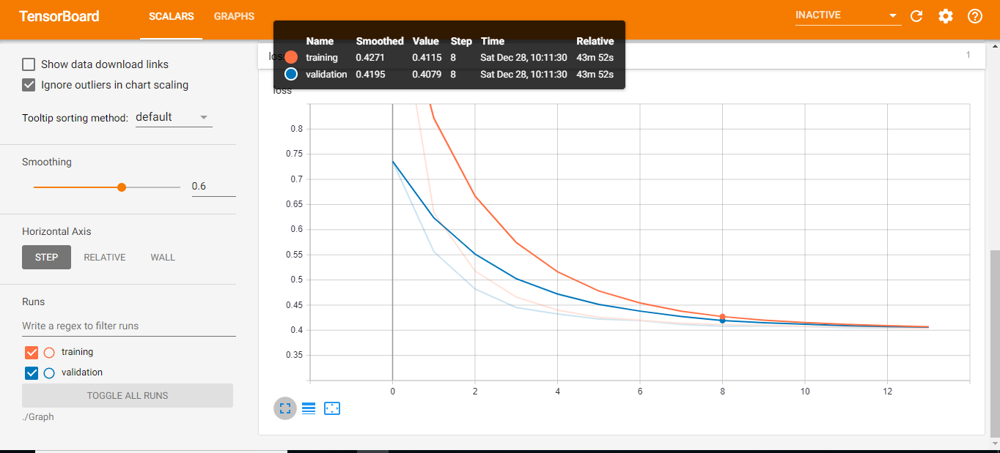

In [8]:
from IPython.display import Image
Image("model_3_loss.png")

In [13]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Model","Description", "Test loss", "Test AUC"]
x.add_row(["1","On all text data","0.4266", "0.7545"])
x.add_row(["2","Tfidf values","0.4205", "0.7310"])
x.add_row(["3","On filtered data by idf values with ConvNets","0.3834", "0.7625"])
print(x)

+-------+----------------------------------------------+-----------+----------+
| Model |                 Description                  | Test loss | Test AUC |
+-------+----------------------------------------------+-----------+----------+
|   1   |               On all text data               |   0.4266  |  0.7545  |
|   2   |        On filtered data by idf values        |   0.4205  |  0.7310  |
|   3   | On filtered data by idf values with ConvNets |   0.3834  |  0.7625  |
+-------+----------------------------------------------+-----------+----------+
